## Código a copiar:

In [ ]:
# EXPORTAR: barras_apiladas

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import font_manager
from pathlib import Path
import matplotlib.ticker as mticker
from matplotlib.ticker import FuncFormatter
from statistics import mode
import subprocess

def limpiar_svg_con_scour(archivo_entrada, archivo_salida):
    subprocess.run([
        'scour', '-i', archivo_entrada, '-o', archivo_salida,
        '--enable-viewboxing', '--enable-id-stripping',
        '--shorten-ids', '--remove-descriptive-elements'
    ], check=True)

def limpiar_svg_con_svgo(archivo_entrada, archivo_salida):
    subprocess.run(['svgo', archivo_entrada, '-o', archivo_salida], check=True)

def formato_fechas(fechas):
    fechas = pd.to_datetime(fechas)
    # Si todos los años son diferentes, mostrar solo el año
    if len(set(f.year for f in fechas)) == len(fechas):
        return [str(f.year) for f in fechas]
    else:
        return [f.strftime("%d-%m-%Y") for f in fechas]

def barras_apiladas(
    df_wide, 
    nombre=None,
    font='Montserrat',
    fontsize_barra=15, 
    fontsize_valor_total=20,
    bar_height=0.5, 
    aumenta_ancho_fig=0,
    aumenta_alto_fig=0,
    aumenta_sep_leyenda=0.0,
    valor_barra=False, 
    valor_total=True,
    porcentaje_barra=False, 
    porcentaje_total=False, 
    porcentaje_total_inicio=False,
    orientacion='horizontal',
    ordenar_por='valor',      # 'valor' o 'etiqueta'
    orden='descendente',       # 'ascendente' o 'descendente'
    quitar_capsula=False,
    area_min=0,
    espacio_inicio=0,  # Espacio para el porcentaje total al inicio de la barra 
    paleta_colores=None,
    agregar_datos=None,
    asignar_etiquetas=None,
    grillas=True,
    leyenda=None,
    union_izquierda=0,
    union_derecha=0,       
    sustituir_etiquetas=None,
    separar_por_total=0.0,
    y_limits=None,
    nombre_eje_x=None,
    nombre_eje_y=None,
    resaltar_etiquetas=None
):
    # Configuración de la fuente
    font_config = {
        'family': font,
        'variable_x': {'size': 25, 'weight': 'medium', 'color': '#000000'},
        'variable_y': {'size': 22, 'weight': 'medium', 'color': '#000000'},
        'nombre_eje_x': {'size': 25, 'weight': 'medium', 'color': '#000000'},
        'nombre_eje_y': {'size': 22, 'weight': 'medium', 'color': '#000000'},
        'valor_capsula': {'size': fontsize_valor_total, 'weight': 'bold', 'color': '#10302C'},
        'valor_porcentaje_barra': {'size': fontsize_barra, 'weight': 'medium', 'color': '#ffffff'},
        'porcentaje_total': {'size': 22, 'weight': 'semibold', 'color': '#4C6A67'},
        'leyenda': {'size': 24, 'weight': 'medium', 'color': '#767676'}
    }

    plt.rcParams['svg.fonttype'] = 'none'
    font_dirs = [Path("../0_fonts")]
    font_files = font_manager.findSystemFonts(fontpaths=font_dirs)
    for font_file in font_files:
        font_manager.fontManager.addfont(font_file)

    nombre_df = nombre or "barras_apiladas"
    if paleta_colores:
        colores_asignados = paleta_colores
    else:
        colores_asignados = ["#10302C", "#4C6A67", "#8FA8A6", "#A3C9A8"]

    if isinstance(df_wide, pd.DataFrame):
        df_wide = df_wide.copy()
        categorias_x = df_wide.columns[0]
        # Conversión automática de años enteros a fechas
        if (
            pd.api.types.is_integer_dtype(df_wide[categorias_x])
            and df_wide[categorias_x].between(1900, 2100).all()
        ):
            df_wide[categorias_x] = df_wide[categorias_x].apply(lambda x: pd.Timestamp(x, 1, 1))
        df_wide = df_wide.set_index(categorias_x)
    else:
        raise ValueError("El argumento df_wide debe ser un DataFrame de pandas.")

    # --- UNIÓN DE LAS PRIMERAS N BARRAS ---
    etiqueta_union_izq = "Unión"
    if union_izquierda > 1 and len(df_wide) >= union_izquierda:
        union = df_wide.iloc[:union_izquierda].sum()
        idxs = df_wide.index[:union_izquierda]
        if np.issubdtype(type(idxs[0]), np.datetime64) or isinstance(idxs[0], pd.Timestamp):
            etiqueta_union_izq = f"{idxs[0].year}-{idxs[-1].year}"
        elif isinstance(idxs[0], (int, np.integer, float)):
            etiqueta_union_izq = f"{idxs[0]}-{idxs[-1]}"
        else:
            etiqueta_union_izq = f"{idxs[0]}-{idxs[-1]}"
        df_wide = pd.concat([
            pd.DataFrame([union], index=[etiqueta_union_izq]),
            df_wide.iloc[union_izquierda:]
        ])

    # --- UNIÓN DE LAS ÚLTIMAS N BARRAS ---
    etiqueta_union_der = "Unión"
    if union_derecha > 1 and len(df_wide) >= union_derecha:
        union = df_wide.iloc[-union_derecha:].sum()
        idxs = df_wide.index[-union_derecha:]
        if np.issubdtype(type(idxs[0]), np.datetime64) or isinstance(idxs[0], pd.Timestamp):
            etiqueta_union_der = f"{idxs[0].year}-{idxs[-1].year}"
        elif isinstance(idxs[0], (int, np.integer, float)):
            etiqueta_union_der = f"{idxs[0]}-{idxs[-1]}"
        else:
            etiqueta_union_der = f"{idxs[0]}-{idxs[-1]}"
        df_wide = pd.concat([
            df_wide.iloc[:-union_derecha],
            pd.DataFrame([union], index=[etiqueta_union_der])
        ])

    # --- AGREGAR DATOS EXTRA SI agregar_datos ESTÁ DEFINIDO ---
    df_wide = df_wide.copy()
    etiquetas_personalizadas = {}
    if agregar_datos is not None:
        filas_extra = []
        for item in agregar_datos:
            # Permite tuplas de 2 o 3 elementos
            if len(item) == 3:
                categoria, etiqueta, valor = item
                etiquetas_personalizadas[categoria] = etiqueta
            else:
                categoria, valor = item
                etiqueta = None
            if isinstance(valor, (list, tuple, np.ndarray)):
                fila = dict(zip(df_wide.columns, valor))
            else:
                fila = {col: valor if i == 0 else 0 for i, col in enumerate(df_wide.columns)}
            filas_extra.append(pd.Series(fila, name=categoria))
        df_wide = pd.concat([pd.DataFrame(filas_extra), df_wide])

    # --- AGREGAR UNA FILA ESPACIADORA ENTRE agregar_datos Y EL RESTO ---
    if agregar_datos is not None:
        # Determina el tipo de índice para la barra espaciadora
        if isinstance(df_wide.index[0], (int, np.integer, str)):
            categoria_espaciadora = "__espaciador__"
        else:
            # Obtener la última fecha de agregar_datos y la primera fecha del resto
            fechas_agregar = [d[0] for d in agregar_datos]
            fecha_max_agregar = max(fechas_agregar)
            fechas_resto = [idx for idx in df_wide.index[len(agregar_datos):] if isinstance(idx, pd.Timestamp)]
            if fechas_resto:
                fecha_min_resto = min(fechas_resto)
                # Poner la fecha espaciadora justo entre ambas
                categoria_espaciadora = fecha_max_agregar + (fecha_min_resto - fecha_max_agregar) / 2
            else:
                # Si no hay resto, solo suma un día a la última de agregar_datos
                categoria_espaciadora = fecha_max_agregar + pd.Timedelta(days=1)
        fila_espaciadora = pd.Series({col: 0 for col in df_wide.columns}, name=categoria_espaciadora)
        n_agregar = len(agregar_datos)
        df_wide = pd.concat([
            df_wide.iloc[:n_agregar],                  # barras de agregar_datos
            pd.DataFrame([fila_espaciadora]),          # espaciador
            df_wide.iloc[n_agregar:]                   # el resto
        ])

    etiquetas_finales = None
    if asignar_etiquetas is not None and asignar_etiquetas in df_wide.columns:
        etiquetas_finales = df_wide[asignar_etiquetas].copy()
        df_wide = df_wide.drop(columns=[asignar_etiquetas])        

    # Calcular totales
    suma_total = df_wide.sum(axis=1)
    total_general = suma_total.sum()

    # Definir x_max antes de dibujar las barras para evitar UnboundLocalError
    x_max = suma_total.max() * 1.15

    # ORDENAMIENTO
    if ordenar_por == 'valor':
        sort_index = suma_total.sort_values(ascending=(orden == 'ascendente')).index
    elif ordenar_por == 'etiqueta':
        # Mantener la barra unida a la izquierda y/o derecha, ordenar el resto
        indices = list(df_wide.index)
        izq = []
        der = []
        centro = indices.copy()
        if union_izquierda > 1:
            izq = [etiqueta_union_izq]
            centro = [i for i in centro if i != etiqueta_union_izq]
        if union_derecha > 1:
            der = [etiqueta_union_der]
            centro = [i for i in centro if i != etiqueta_union_der]
        tipos = set(type(idx) for idx in centro)
        if len(tipos) > 1:
            centro_ordenado = sorted(centro, key=lambda x: str(x), reverse=(orden == 'descendente'))
        else:
            centro_ordenado = sorted(centro, reverse=(orden == 'descendente'))
        sort_index = izq + centro_ordenado + der
    else:
        sort_index = df_wide.index  # sin ordenar si valor inválido

    df_wide = df_wide.loc[sort_index]
    suma_total = suma_total.loc[sort_index]


    entidades = df_wide.index.values

    # --- FORMATEO DE ETIQUETAS ---
    # Detectar índices de tipo fecha
    indices_fechas = [
        i for i, idx in enumerate(df_wide.index)
        if isinstance(idx, (pd.Timestamp, np.datetime64))
    ]
    # Formatear todas las fechas juntas si hay al menos una
    if indices_fechas:
        fechas_formateadas = formato_fechas([df_wide.index[i] for i in indices_fechas])
    else:
        fechas_formateadas = []

    entidades_formateadas = []
    fecha_idx = 0
    for i, idx in enumerate(df_wide.index):
        if (union_izquierda > 1 and idx == etiqueta_union_izq) or (union_derecha > 1 and idx == etiqueta_union_der):
            entidades_formateadas.append(idx)
        elif isinstance(idx, (pd.Timestamp, np.datetime64)):
            entidades_formateadas.append(fechas_formateadas[fecha_idx])
            fecha_idx += 1
        else:
            entidades_formateadas.append(str(idx))

    es_fecha = any(
        isinstance(idx, (pd.Timestamp, np.datetime64))
        for idx in df_wide.index
        if not (
            (union_izquierda > 1 and idx == etiqueta_union_izq) or
            (union_derecha > 1 and idx == etiqueta_union_der)
        )
    )

    # --- SUSTITUIR ETIQUETAS SI SE PROPORCIONA LA LISTA ---
    if sustituir_etiquetas is not None:
        if len(sustituir_etiquetas) != len(entidades_formateadas):
            raise ValueError("La longitud de 'sustituir_etiquetas' debe coincidir con el número de barras.")
        entidades_formateadas = list(sustituir_etiquetas)

    # Reemplaza etiquetas personalizadas si existen
    if etiquetas_personalizadas:
        for i, entidad in enumerate(df_wide.index):
            if entidad in etiquetas_personalizadas and etiquetas_personalizadas[entidad] is not None:
                entidades_formateadas[i] = etiquetas_personalizadas[entidad]

    # Si hay espaciador, pon etiqueta "..."
    if agregar_datos is not None:
        # Detecta el valor exacto del espaciador
        if es_fecha:
            # El espaciador es la única fecha que no está en los datos originales ni en agregar_datos
            fechas_agregar = [d[0] for d in agregar_datos]
            fechas_todas = list(df_wide.index)
            fechas_resto = [idx for idx in fechas_todas if idx not in fechas_agregar]
            anio_espaciador = None
            for idx in fechas_resto:
                # El espaciador es la fecha que no aparece en el resto de los datos (tiene todos ceros)
                if (df_wide.loc[idx] == 0).all():
                    anio_espaciador = idx
                    break
            for i, entidad in enumerate(df_wide.index):
                if entidad == anio_espaciador:
                    entidades_formateadas[i] = "..."
        else:
            for i, entidad in enumerate(entidades_formateadas):
                if entidad == "__espaciador__":
                    entidades_formateadas[i] = "..."


    valores = [df_wide[col].values for col in df_wide.columns]
    categorias = df_wide.columns
    posiciones = np.arange(len(entidades))

    # Si hay espaciador, pon etiqueta "..."
    if agregar_datos is not None:
        for i, entidad in enumerate(entidades_formateadas):
            if entidad == "__espaciador__":
                entidades_formateadas[i] = "..."

    # --- Ajuste del ancho de la figura según el ancho de las cápsulas ---
    if orientacion == 'vertical':
        longitudes = []
        for total_valor in suma_total:
            espacio = "\u00A0"
            texto_capsula = f"{espacio*4}{int(total_valor):,}{espacio*4}"
            longitudes.append(len(texto_capsula))
        if longitudes:
            moda_capsula_len = mode(longitudes)
        else:
            moda_capsula_len = 10
        extra_width = moda_capsula_len * 0.1
        base_width = max(12, len(entidades)*extra_width)
        fig_width = base_width + aumenta_ancho_fig
        fig_height = 8 + aumenta_alto_fig
        fig, ax = plt.subplots(figsize=(fig_width, fig_height), dpi=300)
    else:
        fig_width = 12 + aumenta_ancho_fig          
        fig_height = 15 + aumenta_alto_fig                 
        fig, ax = plt.subplots(figsize=(fig_width, fig_height), dpi=300)
    # ---------------------------------------------------------------

    fig.patch.set_facecolor('white')
    ax.set_facecolor('white')

    # Dibujar barras apiladas
    for pos, entidad, total_valor in zip(posiciones, entidades, suma_total):
        left = 0
        for i, valor in enumerate(valores):
            color = colores_asignados[i % len(colores_asignados)]
            label = categorias[i] if pos == 0 else None
            if orientacion == 'horizontal':
                if valor[pos] > 0:
                    ax.barh(pos, valor[pos], height=bar_height, left=left, color=color, edgecolor='none', zorder=2, label=label)
                    area_barra = valor[pos] * bar_height
                    if (porcentaje_barra or valor_barra) and area_barra >= area_min:
                        texto = f"{valor[pos]:,.0f}" if valor_barra else ""
                        if porcentaje_barra:
                            porcentaje_valor = (valor[pos] / total_valor) * 100 if total_valor > 0 else 0
                            texto += f" ({porcentaje_valor:.1f}%)" if valor_barra else f"{porcentaje_valor:.1f}%"
                        ax.text(left + valor[pos] / 2, pos, texto, va='center', ha='center',
                                fontsize=font_config['valor_porcentaje_barra']['size'],
                                fontfamily=font_config['family'],
                                fontweight=font_config['valor_porcentaje_barra']['weight'],
                                color=font_config['valor_porcentaje_barra']['color'])
                left += valor[pos]
            else:
                if valor[pos] > 0:
                    ax.bar(pos, valor[pos], width=bar_height, bottom=left, color=color, edgecolor='none', zorder=2, label=label)
                    area_barra = valor[pos] * bar_height
                    if (porcentaje_barra or valor_barra) and area_barra >= area_min:
                        texto = f"{valor[pos]:,.0f}" if valor_barra else ""
                        if porcentaje_barra:
                            porcentaje_valor = (valor[pos] / total_valor) * 100 if total_valor > 0 else 0
                            texto += f" ({porcentaje_valor:.1f}%)" if valor_barra else f"{porcentaje_valor:.1f}%"
                        ax.text(pos, left + valor[pos] / 2, texto, va='center', ha='center',
                                fontsize=font_config['valor_porcentaje_barra']['size'],
                                fontfamily=font_config['family'],
                                fontweight=font_config['valor_porcentaje_barra']['weight'],
                                color=font_config['valor_porcentaje_barra']['color'])
                left += valor[pos]

        # Determina si es la barra espaciadora
        es_espaciador = False
        if agregar_datos is not None:
            es_espaciador = entidad == "__espaciador__"

        # Determina si es la barra espaciadora
        es_espaciador = False
        if agregar_datos is not None:
            # Detecta si el índice es el espaciador
            if es_fecha:
                # El espaciador es la fecha que no aparece en el resto de los datos (tiene todos ceros)
                if (df_wide.loc[entidad] == 0).all():
                    es_espaciador = True
            else:
                es_espaciador = entidad == "__espaciador__"

        # Mostrar valor total o etiqueta personalizada solo si NO es espaciador
        if valor_total and not es_espaciador:
            # Si hay etiquetas_finales, usa esa etiqueta
            etiqueta_personal = None
            if etiquetas_finales is not None:
                try:
                    etiqueta_personal = etiquetas_finales.iloc[pos]
                except Exception:
                    etiqueta_personal = None
            texto_a_mostrar = f"{int(total_valor):,}"
            if etiqueta_personal is not None and not pd.isna(etiqueta_personal):
                texto_a_mostrar = str(etiqueta_personal)
            if orientacion == 'horizontal':
                espacio = "\u00A0"
                texto_capsula = f"{espacio*4}{texto_a_mostrar}{espacio*4}"
                if not quitar_capsula:
                    t = ax.text(total_valor + x_max * 0.03, pos, texto_capsula,
                        bbox=dict(boxstyle="round,pad=0.15,rounding_size=0.8", facecolor='white', edgecolor='#002F2A', linewidth=1.5),
                        ha='left', va='center',
                        fontsize=font_config['valor_capsula']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['valor_capsula']['weight'],
                        color=font_config['valor_capsula']['color'])
                    fig.canvas.draw()
                else:
                    ax.text(total_valor + x_max * 0.03, pos, texto_a_mostrar,
                        ha='left', va='center',
                        fontsize=font_config['valor_capsula']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['valor_capsula']['weight'],
                        color=font_config['valor_capsula']['color'])
            else:
                espacio = "\u00A0"
                texto_capsula = f"{espacio*2}{texto_a_mostrar}{espacio*2}"
                if not quitar_capsula:
                    t = ax.text(pos, total_valor + x_max * 0.03, texto_capsula,
                        bbox=dict(boxstyle="round,pad=0.15,rounding_size=0.8", facecolor='white', edgecolor='#002F2A', linewidth=1.5),
                        ha='center', va='bottom',
                        fontsize=font_config['valor_capsula']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['valor_capsula']['weight'],
                        color=font_config['valor_capsula']['color'])
                    fig.canvas.draw()
                else:
                    ax.text(pos, total_valor + x_max * 0.03, texto_a_mostrar,
                        ha='center', va='bottom',
                        fontsize=font_config['valor_capsula']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['valor_capsula']['weight'],
                        color=font_config['valor_capsula']['color'])

        # Mostrar porcentaje total al inicio de la barra si se solicita
        # ...dentro del ciclo de las barras, en el bloque de porcentaje_total_inicio...
        if porcentaje_total_inicio:
            porcentaje = round((total_valor / total_general) * 100, 1)
            espacio = "\u00A0"
            etiqueta_actual = entidades_formateadas[pos]
            resaltar = resaltar_etiquetas is not None and etiqueta_actual in resaltar_etiquetas
            if resaltar:
                texto_capsula = f"{espacio*1}{etiqueta_actual}   {porcentaje}%{espacio*1}"
                bbox_capsula = dict(facecolor="#a3173e", edgecolor="none", boxstyle="round,pad=0.15,rounding_size=0.8")
                color_texto = "white"
                if orientacion == 'horizontal':
                    ax.text(
                        -x_max*0.02, pos, texto_capsula,
                        ha='right', va='center',
                        fontsize=font_config['porcentaje_total']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['porcentaje_total']['weight'],
                        color=color_texto,
                        bbox=bbox_capsula
                    )
                else:
                    ax.text(
                        pos, -x_max*0.02, texto_capsula,
                        ha='center', va='top',
                        rotation=90,  # <-- Esto rota la cápsula y el texto
                        fontsize=font_config['porcentaje_total']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['porcentaje_total']['weight'],
                        color=color_texto,
                        bbox=bbox_capsula
                    )
            else:
                # Comportamiento normal: solo porcentaje, sin etiqueta ni cápsula
                if orientacion == 'horizontal':
                    ax.text(
                        0, pos, f"{espacio*1}{porcentaje}%{espacio*1}",
                        ha='right', va='center',
                        fontsize=font_config['porcentaje_total']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['porcentaje_total']['weight'],
                        color=font_config['porcentaje_total']['color']
                    )
                else:
                    ax.text(
                        pos, 0, f"{espacio*1}{porcentaje}%{espacio*1}",
                        ha='right', va='top',
                        rotation=90,  # <-- Esto rota el porcentaje solo
                        fontsize=font_config['porcentaje_total']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['porcentaje_total']['weight'],
                        color=font_config['porcentaje_total']['color']
                    )

    # Mostrar porcentaje total al lado derecho de la cápsula o del valor total
        if porcentaje_total:
            porcentaje = round((total_valor / total_general) * 100, 1)
            if orientacion == 'horizontal':
                if valor_total and quitar_capsula:
                    desplazamiento = x_max * (0.15 + separar_por_total)
                elif valor_total:
                    desplazamiento = x_max * (0.18 + separar_por_total)
                else:
                    desplazamiento = x_max * (0.03 + separar_por_total)
                ax.text(
                        total_valor + desplazamiento, pos, f"{porcentaje}%",
                        ha='left', va='center',
                        fontsize=font_config['porcentaje_total']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['porcentaje_total']['weight'],
                        color=font_config['porcentaje_total']['color'])
            else:
                if valor_total and quitar_capsula:
                    desplazamiento = x_max * (0.08 + separar_por_total)
                elif valor_total:
                    desplazamiento = x_max * (0.15 + separar_por_total)
                else:
                    desplazamiento = x_max * (0.03 + separar_por_total)
                ax.text(
                        pos, total_valor + desplazamiento, f"{porcentaje}%",
                        ha='center', va='bottom',
                        fontsize=font_config['porcentaje_total']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['porcentaje_total']['weight'],
                        color=font_config['porcentaje_total']['color'])
                
    # Oculta la etiqueta en el eje si está resaltada y porcentaje_total_inicio está activo
    if porcentaje_total_inicio and resaltar_etiquetas is not None:
        entidades_formateadas = [
            "" if e in resaltar_etiquetas else e
            for e in entidades_formateadas
        ]

    # Configurar ejes y etiquetas
    if orientacion == 'horizontal':
        x_max = suma_total.max() * 1.15  # <-- AGREGADO
        ax.set_yticks(posiciones)
        ax.set_yticklabels(entidades_formateadas, fontsize=font_config['variable_y']['size'],
                           fontweight=font_config['variable_y']['weight'],
                           fontfamily=font_config['family'])
        ax.invert_yaxis()
        ax.set_ylim(-0.5, len(entidades)-0.5)
        if y_limits is not None:  # <-- AGREGADO
            ax.set_xlim(y_limits)
        else:
            ax.set_xlim(0, 1.1 * x_max)
        ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins='auto', steps=[1, 2, 5, 10]))
        ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x):,}"))
        plt.setp(ax.get_xticklabels(),
                 fontsize=font_config['variable_x']['size'],
                 fontweight=font_config['variable_x']['weight'],
                 fontfamily=font_config['family'],
                 color=font_config['variable_x']['color'])
        if grillas:
            ax.grid(visible=True, axis='x', color='#B9B9B9', linewidth=0.75, linestyle='-')
        else:
            ax.grid(False)
        if porcentaje_total_inicio:
            ax.tick_params(axis='y', pad=espacio_inicio)
        # --- NOMBRE DE EJES ---
        if nombre_eje_x is not None:
            ax.set_xlabel(
                nombre_eje_x,
                fontsize=font_config['nombre_eje_x']['size'],
                fontweight=font_config['nombre_eje_x']['weight'],
                fontfamily=font_config['family'],
                color=font_config['nombre_eje_x']['color'],
                labelpad=18
            )
        if nombre_eje_y is not None:
            ax.set_ylabel(
                nombre_eje_y,
                fontsize=font_config['nombre_eje_y']['size'],
                fontweight=font_config['nombre_eje_y']['weight'],
                fontfamily=font_config['family'],
                color=font_config['nombre_eje_y']['color'],
                labelpad=18
            )
    else:
        x_max = suma_total.max() * 1.15  # <-- AGREGADO
        ax.set_xticks(posiciones)
        ax.set_xticklabels(entidades_formateadas, fontsize=font_config['variable_x']['size'], fontweight=font_config['variable_x']['weight'], fontfamily=font_config['family'], rotation=90, ha='right')
        ax.set_xlim(-0.5, len(entidades)-0.5)
        if y_limits is not None:  # <-- AGREGADO
            ax.set_ylim(y_limits)
        else:
            ax.set_ylim(0, 1.1 * x_max)
        ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins='auto', steps=[1, 2, 5, 10]))
        ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x):,}"))
        plt.setp(ax.get_yticklabels(),
                 fontsize=font_config['variable_y']['size'],
                 fontweight=font_config['variable_y']['weight'],
                 fontfamily=font_config['family'],
                 color=font_config['variable_y']['color'])
        if grillas:
            ax.grid(visible=grillas, axis='y', color='#B9B9B9', linewidth=0.75, linestyle='-')
        else:
            ax.grid(False)
        if porcentaje_total_inicio:
            ax.tick_params(axis='x', pad=espacio_inicio)
        # --- NOMBRE DE EJES ---
        if nombre_eje_x is not None:
            ax.set_xlabel(
                nombre_eje_x,
                fontsize=font_config['nombre_eje_x']['size'],
                fontweight=font_config['nombre_eje_x']['weight'],
                fontfamily=font_config['family'],
                color=font_config['nombre_eje_x']['color'],
                labelpad=18
            )
        if nombre_eje_y is not None:
            ax.set_ylabel(
                nombre_eje_y,
                fontsize=font_config['nombre_eje_y']['size'],
                fontweight=font_config['nombre_eje_y']['weight'],
                fontfamily=font_config['family'],
                color=font_config['nombre_eje_y']['color'],
                labelpad=18
            )    



    # Ajustar rotación de etiquetas especiales según la orientación
    if orientacion == 'vertical':
        for label, entidad in zip(ax.get_xticklabels(), entidades_formateadas):
            if str(entidad) == "Previo":
                label.set_rotation(90)  # Cambia a vertical
                label.set_ha('center')
            elif str(entidad) == "...":
                label.set_rotation(0)
                label.set_ha('center')
    else:  # horizontal
        for label, entidad in zip(ax.get_yticklabels(), entidades_formateadas):
            if str(entidad) == "...":
                label.set_rotation(90)
                label.set_va('center')
            elif str(entidad) == "Previo":
                label.set_rotation(0)
                label.set_va('center')

    if leyenda:
        ncol_leyenda = len(df_wide.columns)
        ax.legend(
            title=leyenda if isinstance(leyenda, str) else None,
            fontsize=font_config['leyenda']['size'],
            title_fontsize=font_config['leyenda']['size'],
            loc='upper center',
            bbox_to_anchor=(0.5, 1.08 + aumenta_sep_leyenda),
            frameon=False,
            ncol=ncol_leyenda
        )

        
    # Quitar bordes
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)

    plt.tight_layout()
    plt.savefig(f"{nombre_df}.svg", format='svg', bbox_inches='tight', dpi=300)
    plt.savefig(f"{nombre_df}.png", format='png', bbox_inches='tight', dpi=300)
    nombre_svg = f"{nombre_df}.svg"
    nombre_svg_limpio = f"{nombre_df}_scour.svg"
    nombre_svg_svgo = f"{nombre_df}_svgo.svg"

    try:
        limpiar_svg_con_scour(nombre_svg, nombre_svg_limpio)
    except Exception as e:
        print("Error al limpiar con Scour:", e)

    try:
        limpiar_svg_con_svgo(nombre_svg_limpio, nombre_svg_svgo)
    except Exception as e:
        print("Error al limpiar con SVGO:", e)

    plt.show()

## Barra de datos previos con puntos suspensivos

In [2]:
# DATAFRAME DE EJEMPLO
data1 = {
    'año': list(range(2005, 2026)),
    'movimiento': [192, 0, 174, 234, 412, 852, 835, 680, 863, 869, 789, 970, 1070, 628, 685, 1188, 1639, 1508, 2245, 3131, 487],
    'sin_movimiento': [313, 0, 185, 247, 400, 1149, 1560, 1418, 1436, 1355, 1271, 1457, 1919, 1797, 2274, 2645, 3117, 2854, 3852, 5846, 3995],
    'porcentaje': ['38%', '0%', '48%', '49%', '51%', '43%', '35%', '32%', '38%', '39%', '38%', '40%', '36%', '26%', '23%', '31%', '34%', '35%', '37%', '35%', '11%']
}

df1 = pd.DataFrame(data1)
df1f = df1.iloc[2:].reset_index(drop=True)
df1f

,año,movimiento,sin_movimiento,porcentaje
0,2007,174,185,48%
1,2008,234,247,49%
2,2009,412,400,51%
3,2010,852,1149,43%
4,2011,835,1560,35%
5,2012,680,1418,32%
6,2013,863,1436,38%
7,2014,869,1355,39%
8,2015,789,1271,38%
9,2016,970,1457,40%


Scour processed file "barra_previa.svg" in 39 ms: 13983/24637 bytes new/orig -> 56.8%

barra_previa_scour.svg:
Done in 60 ms!
13.655 KiB - 15.3% = 11.563 KiB


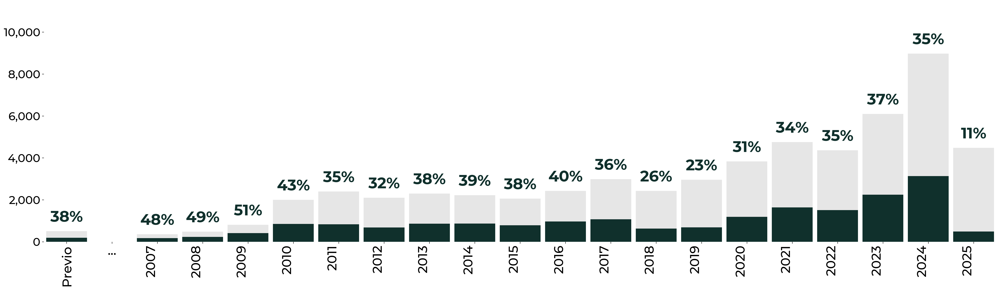

In [ ]:
# EXPORTAR: barra_previa

barras_apiladas(df1f, 
                nombre="barra_previa", 
                bar_height=0.9, 
                font='Montserrat',
                fontsize_valor_total=30,
                ordenar_por='etiqueta',
                orden='ascendente',
                valor_barra=False, 
                porcentaje_barra=False,
                porcentaje_total=False,
                orientacion='vertical',
                quitar_capsula=True,
                agregar_datos=[(pd.Timestamp(2005, 1, 1), "Previo", (192, 313, "38%"))],
                asignar_etiquetas='porcentaje',
                grillas=False,
                paleta_colores=["#10302C", "#E6E6E6"]
                )

## Unión de barras

In [4]:
data2 = {
    'año': list(range(2007, 2026)),
    'movimiento': [174, 234, 412, 852, 835, 680, 863, 869, 789, 970, 1070, 628, 685, 1188, 1639, 1508, 2245, 3131, 487],
    'sin_movimiento': [185, 247, 400, 1149, 1560, 1418, 1436, 1355, 1271, 1457, 1919, 1797, 2274, 2645, 3117, 2854, 3852, 5846, 3995],
}
df2 = pd.DataFrame(data2)
df2

,año,movimiento,sin_movimiento
0,2007,174,185
1,2008,234,247
2,2009,412,400
3,2010,852,1149
4,2011,835,1560
5,2012,680,1418
6,2013,863,1436
7,2014,869,1355
8,2015,789,1271
9,2016,970,1457


### Gráfica original

Scour processed file "apiladas_original.svg" in 72 ms: 26875/46043 bytes new/orig -> 58.4%

apiladas_original_scour.svg:
Done in 73 ms!
26.245 KiB - 17.5% = 21.661 KiB


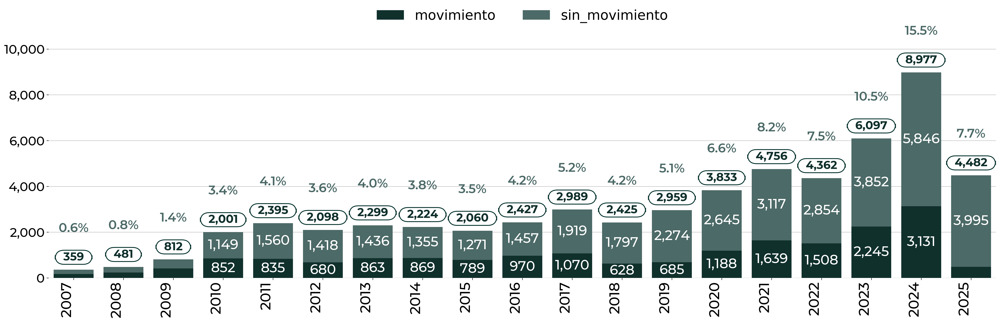

In [5]:
barras_apiladas(df2, 
                nombre="apiladas_original", 
                bar_height=0.8, 
                font='Montserrat',
                valor_barra=True, 
                fontsize_barra=24,
                porcentaje_barra=False, 
                porcentaje_total=True,
                orientacion='vertical',
                ordenar_por='etiqueta',
                orden='ascendente',
                area_min=500,
                leyenda=True
                )

### Gráfica con unión de barras a la izquierda

Scour processed file "union_barras_izquierda.svg" in 49 ms: 22863/38726 bytes new/orig -> 59.0%

union_barras_izquierda_scour.svg:
Done in 80 ms!
22.327 KiB - 18% = 18.311 KiB


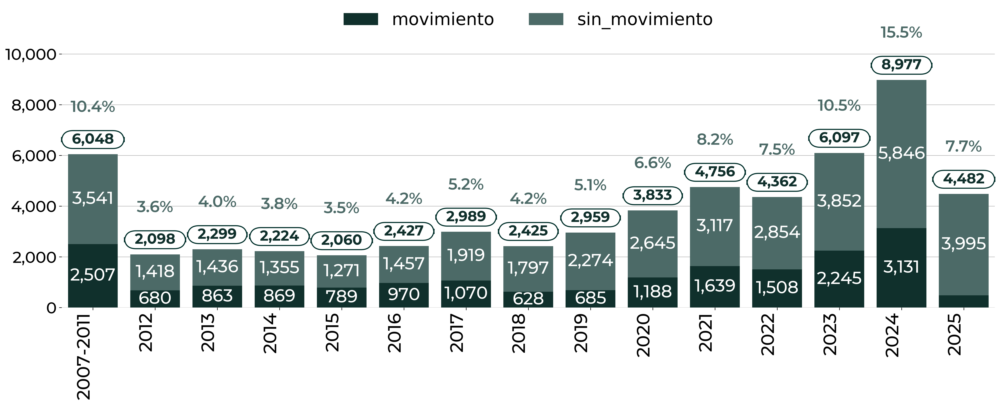

In [6]:
barras_apiladas(df2, 
                nombre="union_barras_izquierda", 
                bar_height=0.8, 
                font='Montserrat',
                valor_barra=True, 
                fontsize_barra=24,
                porcentaje_barra=False, 
                porcentaje_total=True,
                orientacion='vertical',
                ordenar_por='etiqueta',
                orden='ascendente',
                area_min=500,
                leyenda=True,
                union_izquierda=5
                )

### Gráfica con unión de barras a la derecha

Scour processed file "union_barras_derecha.svg" in 68 ms: 22273/38994 bytes new/orig -> 57.1%

union_barras_derecha_scour.svg:
Done in 101 ms!
21.751 KiB - 16.7% = 18.113 KiB


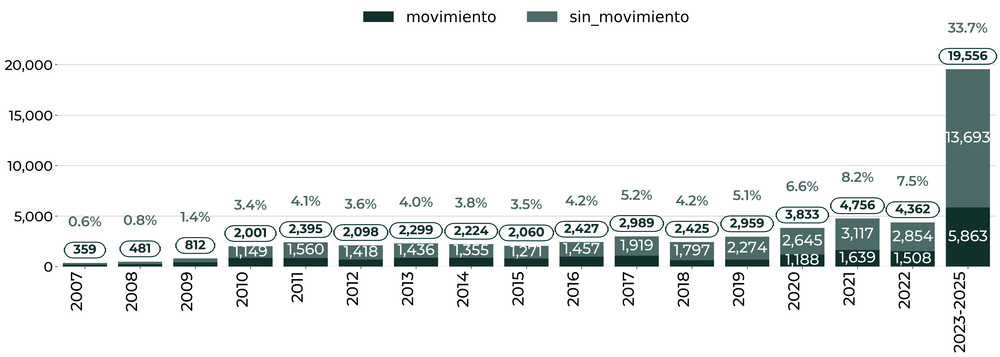

In [7]:
barras_apiladas(df2, 
                nombre="union_barras_derecha", 
                bar_height=0.8, 
                font='Montserrat',
                valor_barra=True, 
                fontsize_barra=24,
                porcentaje_barra=False, 
                porcentaje_total=True,
                orientacion='vertical',
                ordenar_por='etiqueta',
                orden='ascendente',
                area_min=900,
                leyenda=True,
                union_derecha=3
                )

## Sustitución de etiquetas

Scour processed file "sustitucion_etiquetas.svg" in 52 ms: 22365/39069 bytes new/orig -> 57.2%

sustitucion_etiquetas_scour.svg:
Done in 107 ms!
21.841 KiB - 16.7% = 18.196 KiB


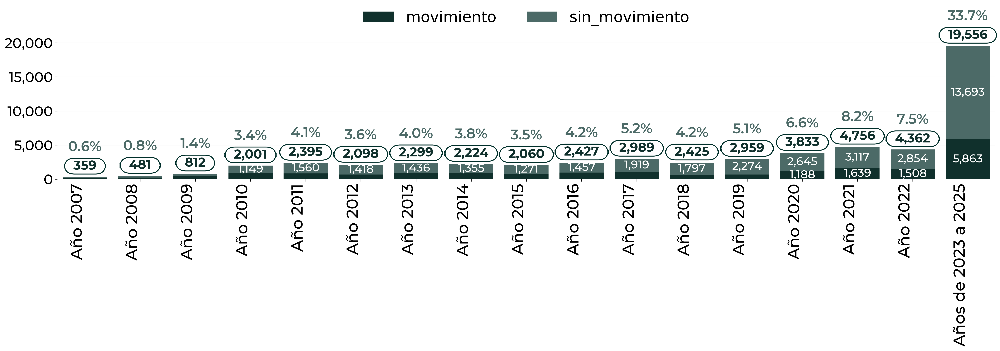

In [8]:
etiquetas_nuevas = ['Año 2007', 'Año 2008', 'Año 2009', 'Año 2010', 'Año 2011',
                    'Año 2012', 'Año 2013', 'Año 2014', 'Año 2015', 'Año 2016',
                    'Año 2017', 'Año 2018', 'Año 2019', 'Año 2020', 'Año 2021',
                    'Año 2022', 'Años de 2023 a 2025']

barras_apiladas(df2, 
                nombre="sustitucion_etiquetas", 
                bar_height=0.8, 
                font='Montserrat',
                valor_barra=True, 
                fontsize_barra=18,
                porcentaje_barra=False, 
                porcentaje_total=True,
                orientacion='vertical',
                ordenar_por='etiqueta',
                orden='ascendente',
                area_min=900,
                leyenda=True,
                union_derecha=3,
                sustituir_etiquetas=etiquetas_nuevas
                )

## Gráficas de barras horizontales

Scour processed file "barras_horizontales_1.svg" in 43 ms: 14263/25154 bytes new/orig -> 56.7%

barras_horizontales_1_scour.svg:
Done in 65 ms!
13.929 KiB - 19.6% = 11.201 KiB


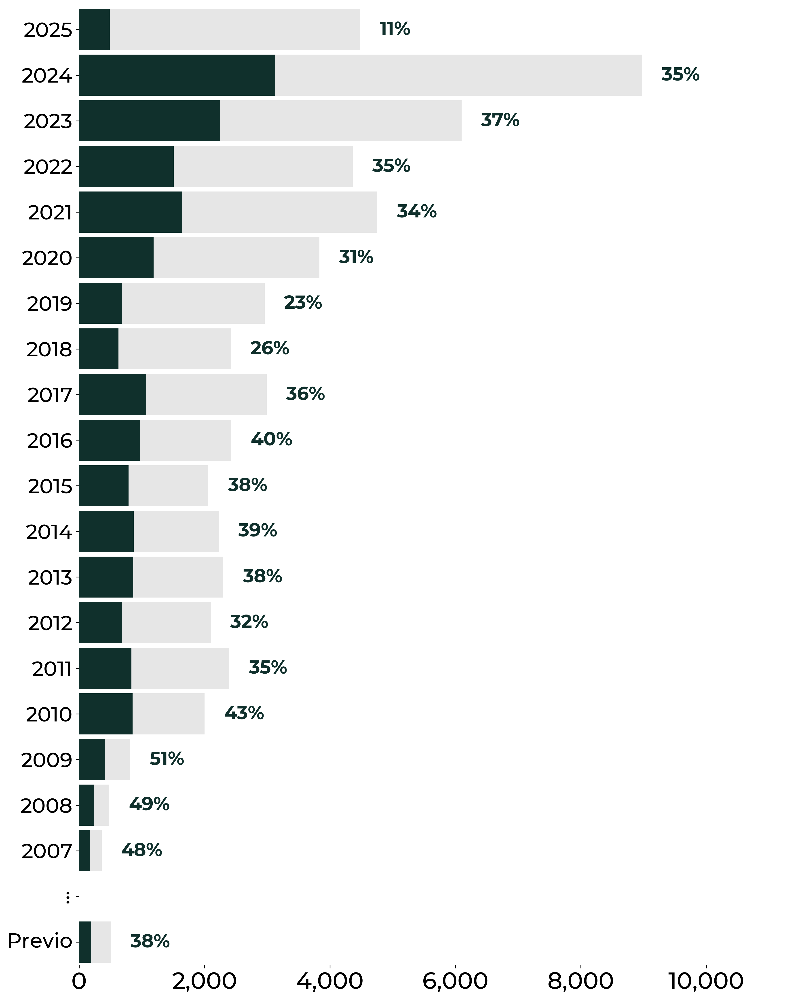

In [9]:
barras_apiladas(df1f, 
                nombre="barras_horizontales_1", 
                bar_height=0.9, 
                font='Montserrat',
                fontsize_valor_total=20,
                ordenar_por='etiqueta',
                orden='ascendente',
                valor_barra=False, 
                porcentaje_barra=False,
                porcentaje_total=False,
                orientacion='horizontal',
                quitar_capsula=True,
                agregar_datos=[(pd.Timestamp(2005, 1, 1), "Previo", (192, 313, "38%"))],
                asignar_etiquetas='porcentaje',
                grillas=False,
                paleta_colores=["#10302C", "#E6E6E6"]
                )

Scour processed file "barras_horizontales_2.svg" in 64 ms: 22842/39278 bytes new/orig -> 58.2%

barras_horizontales_2_scour.svg:
Done in 82 ms!
22.307 KiB - 20% = 17.851 KiB


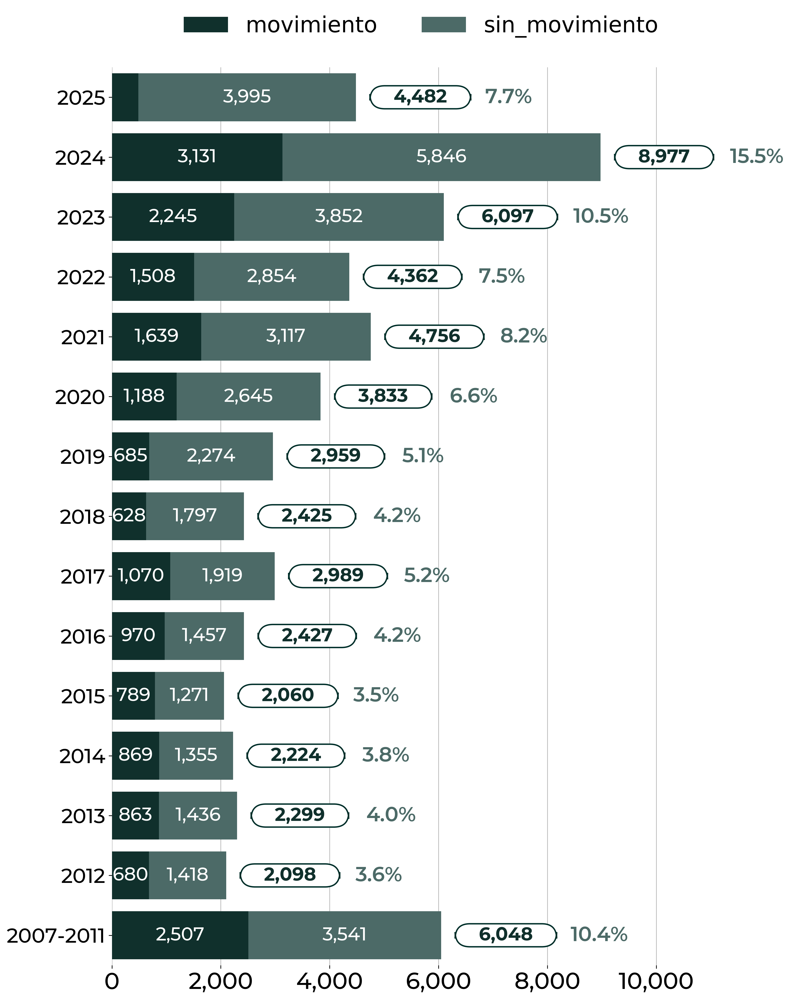

In [10]:
barras_apiladas(df2, 
                nombre="barras_horizontales_2", 
                bar_height=0.8, 
                font='Montserrat',
                valor_barra=True, 
                fontsize_barra=20,
                porcentaje_barra=False, 
                porcentaje_total=True,
                orientacion='horizontal',
                ordenar_por='etiqueta',
                orden='ascendente',
                area_min=500,
                leyenda=True,
                union_izquierda=5,
                separar_por_total=0.05
                )

## Reducir o aumentar el espacio entre barras

Scour processed file "espacion_entre_barras.svg" in 59 ms: 22847/39190 bytes new/orig -> 58.3%

espacion_entre_barras_scour.svg:
Done in 85 ms!
22.312 KiB - 20.1% = 17.832 KiB


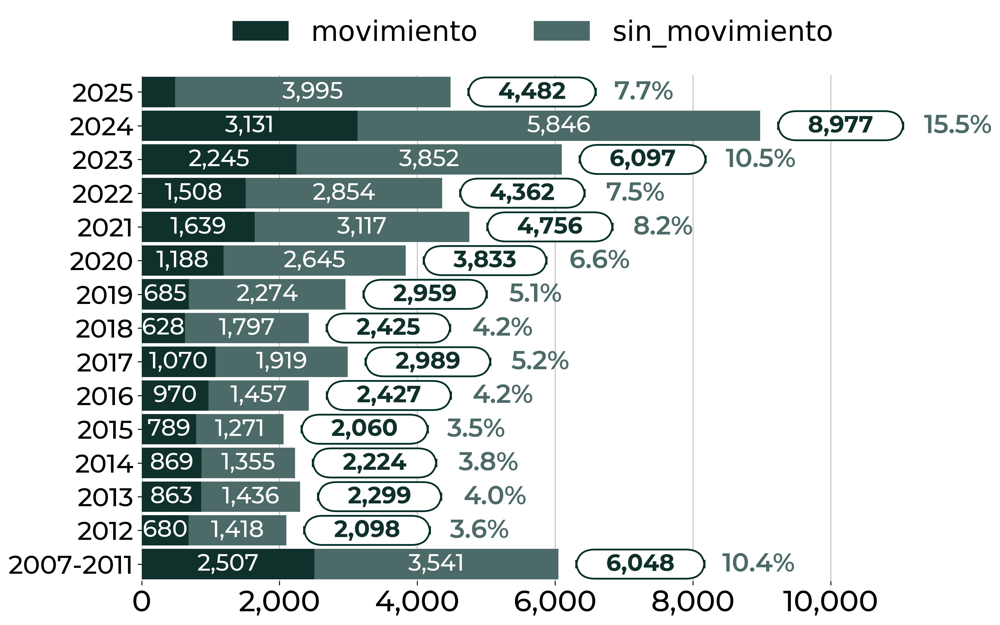

In [11]:
# Se ajusta la separación de las barras mediante la variación de: 
# bar_height
# aumenta_alto_fig
# aumenta_ancho_fig
# aumenta_sep_leyenda

barras_apiladas(df2, 
                nombre="espacion_entre_barras", 
                bar_height=0.9, 
                font='Montserrat',
                valor_barra=True, 
                fontsize_barra=20,
                porcentaje_barra=False, 
                porcentaje_total=True,
                orientacion='horizontal',
                ordenar_por='etiqueta',
                orden='ascendente',
                area_min=500,
                leyenda=True,
                union_izquierda=5,
                separar_por_total=0.05,
                aumenta_alto_fig=-7.5,
                aumenta_sep_leyenda=0.08
                )

## Porecentaje al inicio de las barras

Scour processed file "porcentaje_inicio.svg" in 69 ms: 23104/36226 bytes new/orig -> 63.8%

porcentaje_inicio_scour.svg:
Done in 137 ms!
22.563 KiB - 21.9% = 17.616 KiB


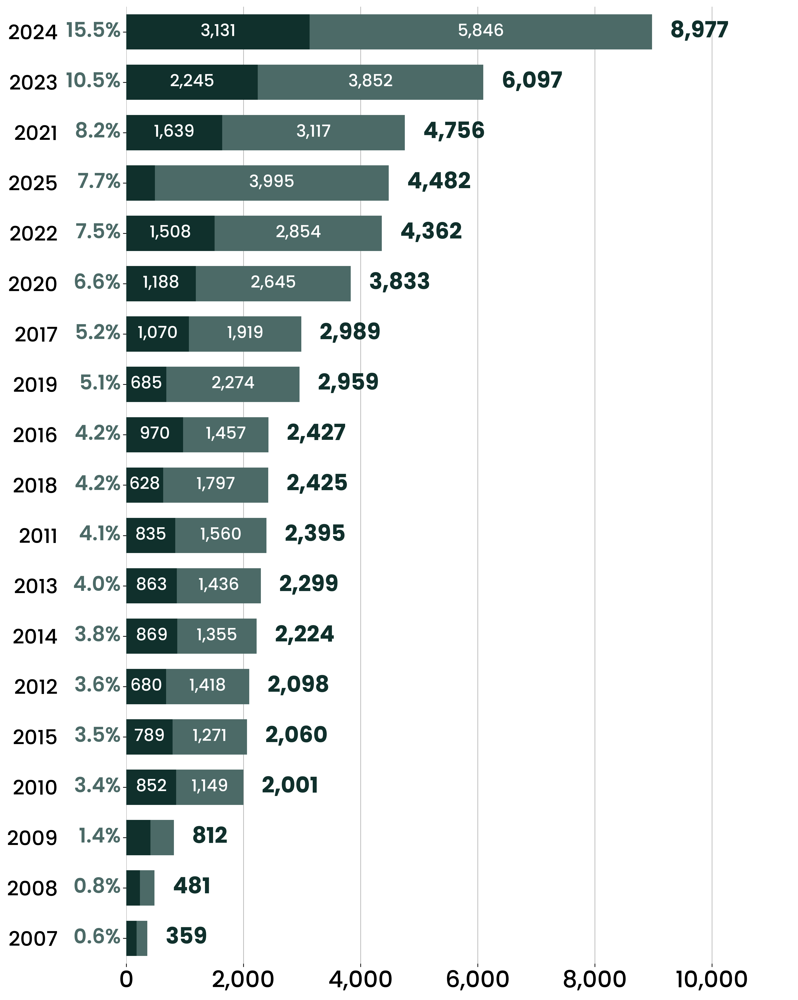

In [12]:
barras_apiladas(df2, 
                nombre="porcentaje_inicio", 
                bar_height=0.7, 
                font='Poppins',
                fontsize_barra=18,
                fontsize_valor_total=24,
                valor_barra=True, 
                valor_total=True,
                porcentaje_barra=False, 
                porcentaje_total=False,
                orientacion='horizontal',
                ordenar_por='valor',
                orden='ascendente',
                quitar_capsula=True,
                porcentaje_total_inicio=True,
                espacio_inicio=70,
                #paleta_colores = ["#8B0000", "#B22222", "#CD5C5C", "#F08080"],
                area_min=350
                )

## Resaltar etiquetas

Scour processed file "resaltar_etiquetas_1.svg" in 59 ms: 23138/36681 bytes new/orig -> 63.1%

resaltar_etiquetas_1_scour.svg:
Done in 94 ms!
22.596 KiB - 21.8% = 17.661 KiB


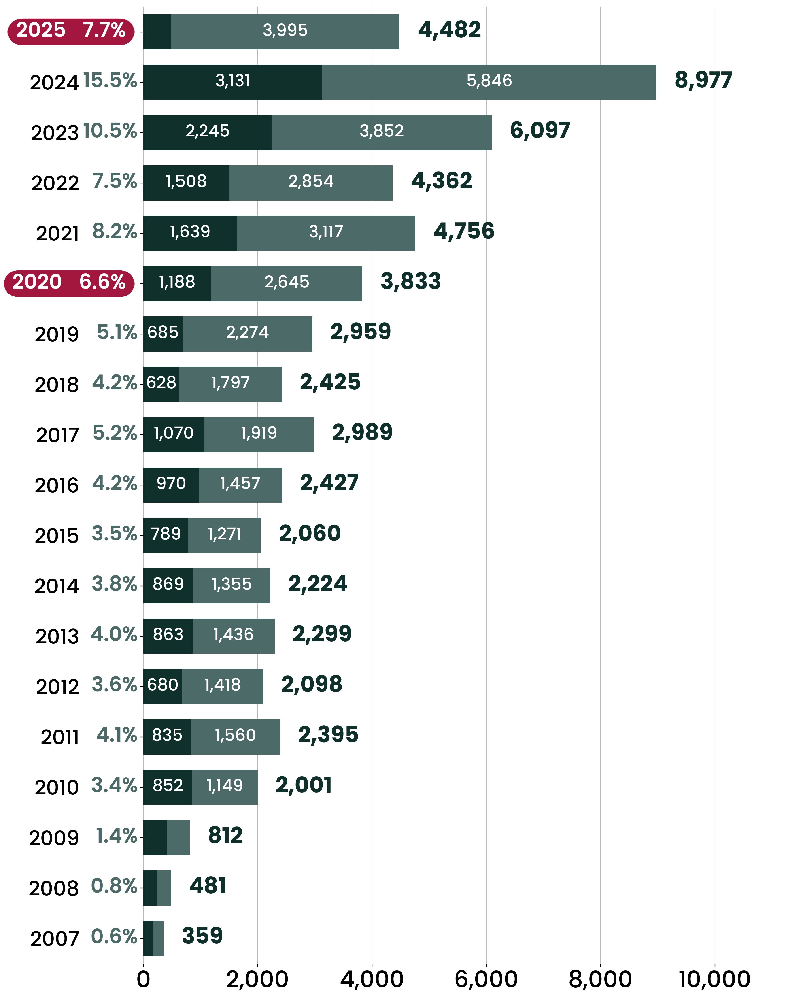

In [13]:
barras_apiladas(df2, 
                nombre="resaltar_etiquetas_1", 
                bar_height=0.7, 
                font='Poppins',
                fontsize_barra=18,
                fontsize_valor_total=24,
                valor_barra=True, 
                valor_total=True,
                porcentaje_barra=False, 
                porcentaje_total=False,
                orientacion='horizontal',
                ordenar_por='etiqueta',
                orden='ascendente',
                quitar_capsula=True,
                porcentaje_total_inicio=True,
                espacio_inicio=65,
                #paleta_colores = ["#8B0000", "#B22222", "#CD5C5C", "#F08080"],
                area_min=350,
                resaltar_etiquetas=["2025", "2020"]
                )

In [14]:
# DataFrame con los 32 estados de la República Mexicana y varias columnas de ejemplo

estados_mexico = [
    'Aguascalientes', 'Baja California', 'Baja California Sur', 'Campeche', 'Chiapas',
    'Chihuahua', 'Ciudad de México', 'Coahuila', 'Colima', 'Durango', 'Estado de México',
    'Guanajuato', 'Guerrero', 'Hidalgo', 'Jalisco', 'Michoacán', 'Morelos', 'Nayarit',
    'Nuevo León', 'Oaxaca', 'Puebla', 'Querétaro', 'Quintana Roo', 'San Luis Potosí',
    'Sinaloa', 'Sonora', 'Tabasco', 'Tamaulipas', 'Tlaxcala', 'Veracruz', 'Yucatán', 'Zacatecas'
]

np.random.seed(42)
data_estados_3 = {
    'estado': estados_mexico,
    'movimiento': np.random.randint(100, 2000, size=32),
    'sin_movimiento': np.random.randint(100, 3000, size=32),
    'pendiente': np.random.randint(10, 300, size=32),
    'cancelado': np.random.randint(5, 50, size=32)
}

df3 = pd.DataFrame(data_estados_3)
df3

,estado,movimiento,sin_movimiento,pendiente,cancelado
0,Aguascalientes,1226,559,101,29
1,Baja California,1559,121,273,11
2,Baja California Sur,960,2400,44,13
3,Campeche,1394,847,215,28
4,Chiapas,1230,574,90,5
5,Chihuahua,1195,1182,59,48
6,Ciudad de México,1824,2658,11,12
7,Coahuila,1144,2147,63,28
8,Colima,1738,2847,115,15
9,Durango,221,1075,269,21


Scour processed file "resaltar_etiquetas_2.svg" in 129 ms: 43276/72040 bytes new/orig -> 60.1%

resaltar_etiquetas_2_scour.svg:
Done in 142 ms!
42.262 KiB - 19.6% = 33.996 KiB


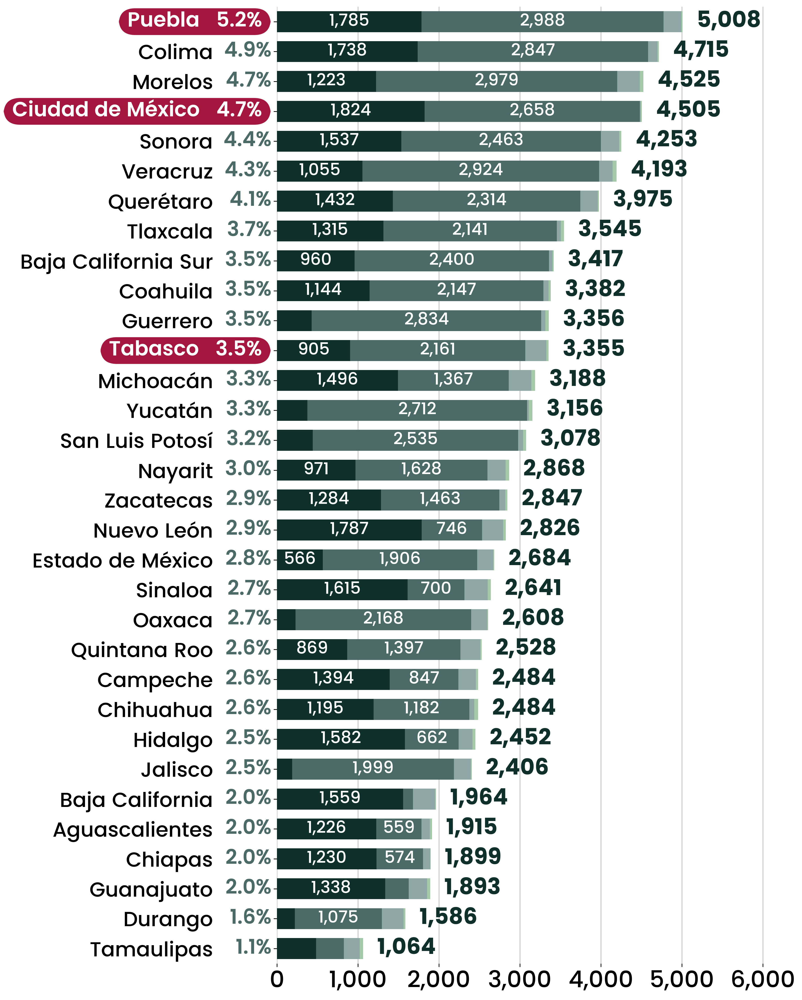

In [15]:
barras_apiladas(df3, 
                nombre="resaltar_etiquetas_2", 
                bar_height=0.7, 
                font='Poppins',
                fontsize_barra=18,
                fontsize_valor_total=24,
                valor_barra=True, 
                valor_total=True,
                porcentaje_barra=False, 
                porcentaje_total=False,
                orientacion='horizontal',
                ordenar_por='valor',
                orden='ascendente',
                quitar_capsula=True,
                porcentaje_total_inicio=True,
                espacio_inicio=65,
                #paleta_colores = ["#8B0000", "#B22222", "#CD5C5C", "#F08080"],
                area_min=350,
                resaltar_etiquetas=["Puebla", "Ciudad de México", "Tabasco"]
                )

## Barras de porcentaje

In [16]:
# Ejemplo de dataframe con porcentajes

np.random.seed(0)
n_filas3 = 20
n_cols3 = 3

# Generar fechas aleatorias para la primera columna
fechas3 = pd.to_datetime(
    np.random.choice(pd.date_range("2015-01-01", "2025-12-31"), n_filas3, replace=False)
)

valores3 = np.random.rand(n_filas3, n_cols3)
valores3 = valores3 / valores3.sum(axis=1, keepdims=True) * 100

# Ajustar la última columna para que la suma sea exactamente 100
valores3 = np.round(valores3, 1)
for i in range(n_filas3):
    suma3 = valores3[i, :-1].sum()
    valores3[i, -1] = 100 - suma3

df3 = pd.DataFrame(valores3, columns=['A', 'B', 'C'])
df3.insert(0, 'fecha', fechas3)
df3

,fecha,A,B,C
0,2024-04-23,44.1,33.3,22.6
1,2019-02-22,36.4,31.9,31.7
2,2018-01-21,45.8,3.7,50.5
3,2019-06-04,40.4,24.2,35.4
4,2021-11-24,43.8,51.9,4.3
5,2015-08-06,20.5,59.2,20.3
6,2020-04-02,25.4,31.8,42.8
7,2016-06-29,21.0,6.2,72.8
8,2025-02-22,43.1,46.6,10.3
9,2018-04-18,33.0,31.8,35.2


Scour processed file "barras_porcentaje.svg" in 65 ms: 21358/35167 bytes new/orig -> 60.7%

barras_porcentaje_scour.svg:
Done in 87 ms!
20.857 KiB - 18.1% = 17.079 KiB


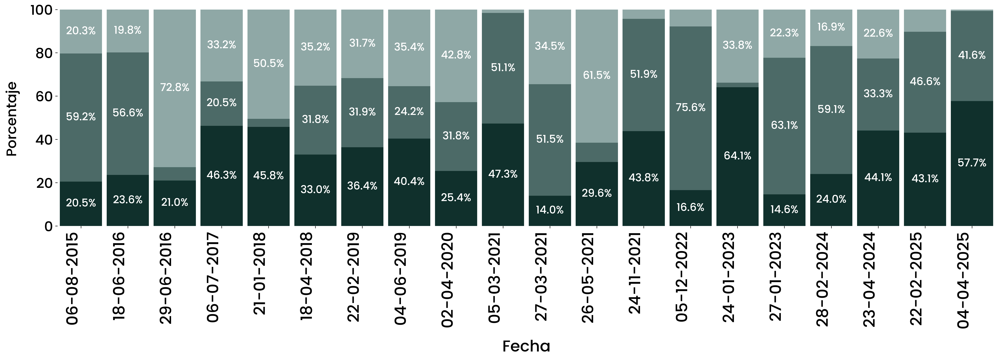

In [17]:
barras_apiladas(df3,
                nombre="barras_porcentaje", 
                bar_height=0.9, 
                font='Poppins',
                fontsize_barra=17,
                valor_barra=False,
                valor_total=False,
                porcentaje_barra=True, 
                porcentaje_total=False,
                orientacion='vertical',
                ordenar_por='etiqueta',
                orden='ascendente',
                grillas=False,
                area_min=10,
                y_limits=(0, 100),
                nombre_eje_x="Fecha",
                nombre_eje_y="Porcentaje"
                )